In [2]:
import pandas as pd
import numpy as np
import geopandas as gpd
import geoplot
import geoplot.crs as gcrs
from matplotlib import pyplot as plt
import pickle

In [3]:
# absolute path for the ~35000 census IDs. 
# read two csv files and merge them.
df_nhts = pd.read_csv("/home/jtl/Documents/shenhao/sat_image_nhts/code/data_initial/raw/data_input_V1.csv")
df_loc = pd.read_csv("/home/jtl/Documents/shenhao/sat_image_nhts/code/data_initial/raw/hhct.csv")

df_loc.drop('HHSTFIPS', axis = 1, inplace = True)

# augment HHCT to df_nhts
df_raw = pd.merge(df_nhts, df_loc, on = 'HOUSEID')

df_raw['HHSTFIPS'] = df_raw['HHSTFIPS'].astype(np.str)
df_raw['HHCNTYFP'] = df_raw['HHCNTYFP'].astype(np.str)
df_raw['HHCT'] = df_raw['HHCT'].astype(np.str)
# HHSTFIPS
df_raw['HHSTFIPS'].loc[df_raw['HHSTFIPS'].str.len() == 1, ] = '0' + df_raw['HHSTFIPS'].loc[df_raw['HHSTFIPS'].str.len() == 1, ]
# HHCNTYFP
for i in range(2): # 2 = 3-1
    augmented_zero_str = '0' * (i+1)
    df_raw['HHCNTYFP'].loc[df_raw['HHCNTYFP'].str.len() == 2-i, ] = augmented_zero_str + df_raw['HHCNTYFP'].loc[df_raw['HHCNTYFP'].str.len() == 2-i, ]
# HHCT
for i in range(5): # 5 = 6-1
    augmented_zero_str = '0' * (i+1)
    df_raw['HHCT'].loc[df_raw['HHCT'].str.len() == 5-i, ] = augmented_zero_str + df_raw['HHCT'].loc[df_raw['HHCT'].str.len() == 5-i, ]
# Create the census tract identifier
df_raw['CENSUS_ID'] = df_raw['HHSTFIPS'] + df_raw['HHCNTYFP'] + df_raw['HHCT']

/home/jtl/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [4]:
# absolute path
df = pd.read_csv("/home/jtl/Documents/travel_modeling_nhts/data_process/df_merged_tract_large.csv")

In [5]:
# absolute path
gdf = gpd.read_file("/home/jtl/Documents/travel_modeling_nhts/visualizing/us_census_tract.shp")

In [6]:
# modify the df CENSUS_ID
# df['CENSUS_ID'] = [ for elt in df['CENSUS_ID'].values if len(elt) == 10]
df['CENSUS_ID'] = ["0" + str(elt) if len(str(elt)) == 10 else str(elt) for elt in df['CENSUS_ID'].values]

In [7]:
# merge
gdf_intersect = gdf.merge(df, left_on = 'GEOID', right_on = 'CENSUS_ID', how = 'inner')
gdf_intersect.shape
# gdf['GEOID']

(18491, 118)

In [5]:
gdf.head(10)

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,layer,path,geometry
0,38,047,972500,38047972500,9725,Census Tract 9725,G5020,S,2571326104,47715596,+46.4692780,-099.5045846,tl_2017_38_tract,/Users/zhangxh/tmp/ustract/tl_2017_38_tract/,"POLYGON ((-99.91742 46.34976, -99.91718 46.355..."
1,38,073,969000,38073969000,9690,Census Tract 9690,G5020,S,1442387838,1962257,+46.4517152,-097.7939289,tl_2017_38_tract,/Users/zhangxh/tmp/ustract/tl_2017_38_tract/,"POLYGON ((-98.03491 46.36969, -98.03491 46.369..."
2,38,009,952400,38009952400,9524,Census Tract 9524,G5020,S,2255183406,53013501,+48.8022043,-100.5257167,tl_2017_38_tract,/Users/zhangxh/tmp/ustract/tl_2017_38_tract/,"POLYGON ((-100.97129 48.95309, -100.96864 48.9..."
3,38,009,952500,38009952500,9525,Census Tract 9525,G5020,S,2055808274,21851497,+48.7703061,-101.2015486,tl_2017_38_tract,/Users/zhangxh/tmp/ustract/tl_2017_38_tract/,"POLYGON ((-101.49674 48.99490, -101.49674 48.9..."
4,38,009,952300,38009952300,9523,Census Tract 9523,G5020,S,10204813,0,+48.8208455,-100.4463352,tl_2017_38_tract,/Users/zhangxh/tmp/ustract/tl_2017_38_tract/,"POLYGON ((-100.46792 48.80690, -100.46791 48.8..."
5,38,097,970100,38097970100,9701,Census Tract 9701,G5020,S,868748612,166083,+47.5923190,-097.1668254,tl_2017_38_tract,/Users/zhangxh/tmp/ustract/tl_2017_38_tract/,"POLYGON ((-97.47354 47.51475, -97.47345 47.515..."
6,38,079,941800,38079941800,9418,Census Tract 9418,G5020,S,174822034,11221901,+48.8622415,-099.7943651,tl_2017_38_tract,/Users/zhangxh/tmp/ustract/tl_2017_38_tract/,"POLYGON ((-99.92007 48.81024, -99.92006 48.811..."
7,38,079,951700,38079951700,9517,Census Tract 9517,G5020,S,614838801,49207061,+48.9102598,-099.9582925,tl_2017_38_tract,/Users/zhangxh/tmp/ustract/tl_2017_38_tract/,"POLYGON ((-100.18298 48.85144, -100.18294 48.8..."
8,38,079,951900,38079951900,9519,Census Tract 9519,G5020,S,1342861979,32248027,+48.6693037,-099.8289101,tl_2017_38_tract,/Users/zhangxh/tmp/ustract/tl_2017_38_tract/,"POLYGON ((-100.18304 48.71996, -100.18304 48.7..."
9,38,079,951600,38079951600,9516,Census Tract 9516,G5020,S,206430972,1261165,+48.9046100,-099.5872508,tl_2017_38_tract,/Users/zhangxh/tmp/ustract/tl_2017_38_tract/,"POLYGON ((-99.65900 48.89227, -99.65879 48.892..."


In [8]:
df.head(10)

,CENSUS_ID,R_AGE_IMP,DRVRCNT,HHSIZE,HHFAMINC,HBHTNRNT,HBPPOPDN,HBRESDN,TRPMILES,TRVLCMIN,...,TRPTRANS_2_mean_norm,TRPTRANS_3_mean_norm,TRIPPURP_0_mean_norm,TRIPPURP_1_mean_norm,TRIPPURP_2_mean_norm,TRIPPURP_3_mean_norm,TRIPPURP_4_mean_norm,density,diversity,design
0,01001020802,54,2,2,20.0,0.1,300,50,13.430,20,...,0.675344,-0.310812,-0.993544,-1.724233,-1.047661,0.018457,3.081432,0.000000,0.000000,0.003806
1,01003010300,49,2,3,112.5,0.1,50,50,10.364,7,...,0.675344,-0.310812,0.029258,1.476451,0.047744,-1.238231,-0.390720,0.000000,0.000000,0.013154
2,01003010703,39,2,4,112.5,0.1,300,300,6.264,12,...,0.675344,-0.310812,0.793327,0.749023,-1.047661,0.761045,-1.147251,0.005631,0.190895,0.111964
3,01003011202,49,3,4,62.5,0.3,1500,1500,3.992,15,...,-0.044711,-0.310812,0.612922,3.133949,0.116207,-1.238231,-2.372111,0.002344,0.999932,0.118858
4,01003011401,69,2,2,87.5,0.2,300,300,10.131,30,...,0.675344,-0.310812,0.612922,0.704858,-0.465727,-0.138629,-0.687929,0.000001,0.000000,0.029466
5,01003011502,66,2,2,42.5,0.4,750,300,11.154,60,...,0.675344,-0.310812,-0.313159,-0.687821,-0.426932,0.521132,0.771696,0.001690,0.675731,0.143299
6,01003011602,67,1,2,20.0,0.1,300,300,18.218,45,...,0.675344,-0.310812,1.445113,0.532471,-1.047661,-0.954462,-0.198973,0.000013,0.937734,0.035824
7,01015001700,50,3,3,62.5,0.2,750,300,3.645,10,...,0.151668,-0.310812,-1.371536,-1.724233,4.031037,-1.238231,0.690039,0.000060,0.641428,0.125523
8,01031011202,44,2,2,87.5,0.6,1500,750,15.671,20,...,-5.085097,-0.310812,-1.371536,-1.076475,-0.271749,-1.238231,3.241830,0.000244,0.935035,0.082515
9,01043965500,46,4,4,112.5,0.1,300,50,12.561,20,...,-0.764766,-0.310812,-0.048564,-0.428718,-0.271749,2.427108,-1.249323,0.000000,0.000000,0.005999


### Visualize three sets of census tracts

In [9]:
gdfset = set([str(elt) for elt in gdf["GEOID"]])

In [10]:
nhtsset = set([str(elt) for elt in df_raw['CENSUS_ID']])

In [11]:
dfset = {"0" + str(elt) if len(str(elt)) == 10 else str(elt) for elt in df["CENSUS_ID"]}

In [12]:
###  
print(len(gdfset)) # census tracts in US
print(len(nhtsset)) # census tracts in NHTS
print(len(dfset)) # census tracts in final regressions

74133
32681
18491


In [13]:
### Keep only the mainland US.
# Hawaii: 15
# Alaska: 02
# American Samoa: 60
# Guam: 66
# Northern Mariana Islands: 69
# Puerto Rico: 72
# Virgin Islands: 78
exclude_list = ['15', '02', '60', '66', '69', '72', '78']

In [14]:
gdfset_mainland = set([str(elt) for elt in gdfset if elt[:2] not in exclude_list])
nhtsset_mainland = set([str(elt) for elt in nhtsset if elt[:2] not in exclude_list])
dfset_mainland = set([str(elt) for elt in dfset if elt[:2] not in exclude_list])

In [15]:
print(len(gdfset_mainland))
print(len(nhtsset_mainland))
print(len(dfset_mainland))

72538
32424
18365


In [16]:
gdf_sub = gdf[gdf["GEOID"].isin(gdfset_mainland)]
nhtsset_sub = gdf[gdf["GEOID"].isin(nhtsset_mainland)]
dfset_sub = gdf[gdf["GEOID"].isin(dfset_mainland)]

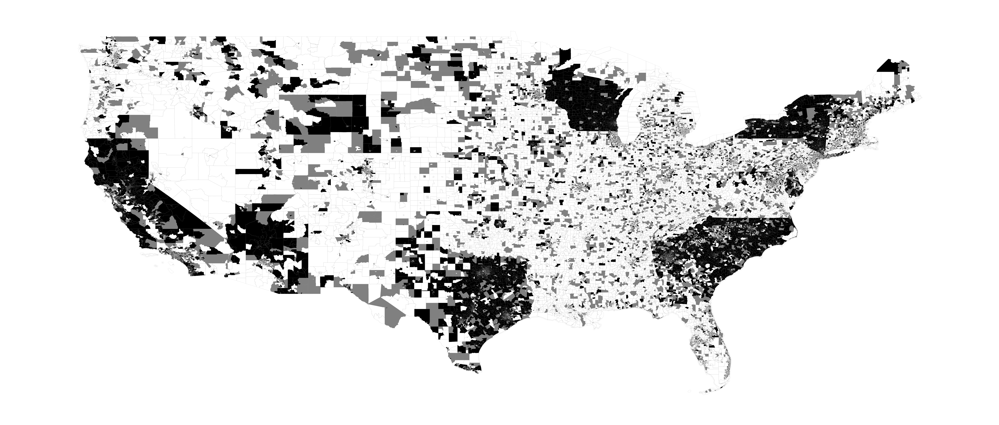

In [17]:
# layer 1: full us
# layer 2: grey + black - nhts census tracts
# layer 3: black: the census tracts used in regressions.

ax = geoplot.polyplot(gdf_sub, 
                 edgecolor = 'grey', 
                 linewidth = 0.2,
                 figsize = (100,100))

geoplot.polyplot(nhtsset_sub, 
                 edgecolor = 'grey', 
                 linewidth = 0.2,                
                 facecolor = 'gray',
                 ax = ax)

geoplot.polyplot(dfset_sub, 
                 edgecolor = 'grey', 
                 linewidth = 0.2,                                  
                 facecolor = 'black',
                 ax = ax)


## Visualize the socio-demographics (e.g. Density)

In [18]:
import mapclassify

In [19]:
gdf_intersect_sub = gdf_intersect[gdf_intersect["GEOID"].isin(dfset_mainland)]
gdf_intersect_sub.shape

(18365, 118)

In [20]:
# create quantiles
gdf_intersect_density = gdf_intersect_sub['density']
scheme = mapclassify.Quantiles(gdf_intersect_density, k=5)

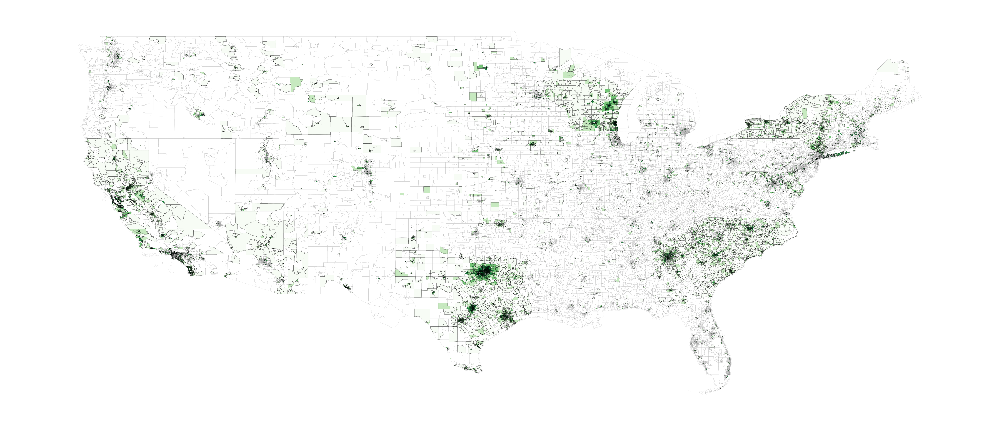

In [21]:
# plot density map with even quantiles for the US
ax = geoplot.polyplot(gdf_sub, 
                 edgecolor = 'grey', 
                 linewidth = 0.2,
                 figsize = (100,100))

geoplot.choropleth(gdf_intersect_sub, 
                   hue=gdf_intersect_density,                   
                   edgecolor = 'black', 
                   linewidth = 0.5,                 
                   ax = ax,
                   scheme=scheme,
                   cmap='Greens')


## Map for MA/CA/Texas

In [22]:
## FIPS info
# California: 06
# MA: 25
# Texas: 48

In [26]:
# example - focus on MA
# ID = '25' # MA
ID = '06' # CA
# ID = '48' # Texas

gdfset_ex = set([str(elt) for elt in gdfset if elt[:2]==ID])
nhtsset_ex = set([str(elt) for elt in nhtsset if elt[:2]==ID])
dfset_ex = set([str(elt) for elt in dfset if elt[:2]==ID])

In [27]:
# 
gdf_sub_ex = gdf[gdf["GEOID"].isin(gdfset_ex)]
nhtsset_sub_ex = gdf[gdf["GEOID"].isin(nhtsset_ex)]
dfset_sub_ex = gdf[gdf["GEOID"].isin(dfset_ex)]

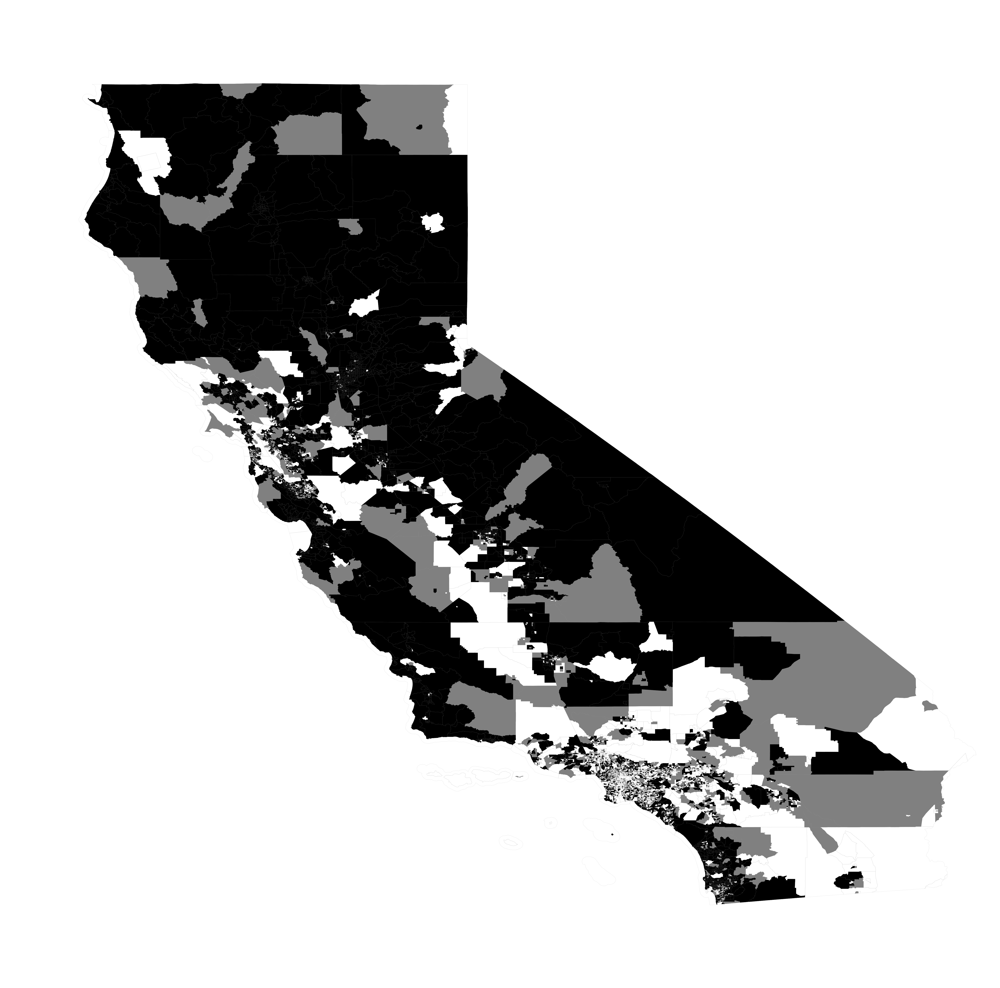

In [28]:
# sw note: notice that the training data set is evenly distributed in MA, CA, and TX.

ax = geoplot.polyplot(gdf_sub_ex, 
                 edgecolor = 'grey', 
                 linewidth = 0.2,
                 figsize = (100,100))

geoplot.polyplot(nhtsset_sub_ex, 
                 edgecolor = 'grey', 
                 linewidth = 0.2,                
                 facecolor = 'gray',
                 ax = ax)

geoplot.polyplot(dfset_sub_ex, 
                 edgecolor = 'grey', 
                 linewidth = 0.2,                                  
                 facecolor = 'black',
                 ax = ax)